# Introduccion

En este notebook va ha medir la *validez* de distintos modelos de redes de neuronas con el fin de entender los modelos generativos Img2Img (Se introduce una image y como resultado sale otra imagen)

En este notebook se va a utilizar el dataset de microsoft de kaggle [dogs vs cats](https://www.kaggle.com/datasets/shaunthesheep/microsoft-catsvsdogs-dataset?resource=download).

El objetivo será intentar recrear las imágenes de los perros a partir de imágenes modificadas aleatoriamente. Para ello:

 1. Las imágenes serán alteradas aleatoriamente (Imágenes borrosas, cambios de color y huecos negros)
 2. Se creearán (entrenamiento y validación) y se compararán las distintas redes de neuronas

# Utilidades

Librerías necesarias:

In [8]:
import os
import numpy as np
from PIL import Image
from PIL import ImageFilter

import cv2
import matplotlib.pyplot as plt

import tensorflow as tf

import random
import pathlib
from IPython import display

import time

Directorios de las imagenes de perros

In [9]:
dogs_dir = "./Datasets/PetImages/Dog/"

In [10]:
dogs_list = os.listdir(dogs_dir)

In [11]:
n_dogs = len(dogs_list)

Se disponen de 12500 imágenes de perros

In [12]:
def get_imgs(target_dir,img_list):
    images = []
    for img in img_list:
        with Image.open(target_dir + img) as img_file:
            images.append(img_file.copy())
    return images

In [13]:
#imgs = get_imgs(dogs_dir,dogs_list)

Vista de las imágenes:

In [14]:
#fig, axs = plt.subplots(1, 5)

#for i, ax in enumerate(axs.flat):
#    ax.imshow(imgs[i], cmap='gray')
#    ax.axis('off')

Como podemos observar cada imagen tiene tamaños diferentes

## Preparación del Dataset

Lo primero que se va ha hacer es modificar las imágenes. Para ello, se van ha redimensionar las imágenes, se van ha crear dos carpetas nuevas: Target e Input. En input se van ha modificar las imágenes.

In [15]:
#output_dir = "./target/"
#os.makedirs("./target", exist_ok=True)

#i = 0
#for img in imgs:
    
#    img = img.convert('RGB')
#    resize = img.resize((256,256))
#    resize.save("./target/"+dogs_list[i])
#    i+=1

In [16]:
#target_dir = "./target/"
#target_list = os.listdir(target_dir)
#target = get_imgs(target_dir,target_list)

In [17]:
def colourized_foto(img):

    aux = img.copy()
    width, height = aux.size
    pix = aux.load()
    blue = random.randint(0,120)

    for py in range(height):
        for px in range(width):
            r,g,b = aux.getpixel((px,py))
            a = random.randint(0,2)
            p = (r,g,b)
            
            if a == 0:
                p = (r,0,0)
            if a == 1:
                p = (0,g,0)
            if a == 2:
                p = (0,0,b)

            pix[px,py] = p
    return aux

In [18]:
#img_green_example = colourized_foto(target[0])
#img_green_example

In [19]:
#img_blur_example = img_green_example.filter(ImageFilter.BoxBlur(random.randint(2,5)))
#img_blur_example

Con esta función añadimos un filtro de blur y cambiamos el color aleatoriamente de los píxeles manteniendo un color.

In [20]:
def random_jitter(input_image):


  input_image =  colourized_foto(input_image)
  input_image = input_image.filter(ImageFilter.BoxBlur(random.randint(3,5)))

  return input_image
#random_jitter(target[0].copy())

In [21]:
#target[0]

In [22]:
input_dir = "./input/"
os.makedirs("./input", exist_ok=True)
os.makedirs("./test", exist_ok=True)

#i = 0
#for t in target:
#    input = t.copy()
#    input = random_jitter(input)
#    input.save(input_dir+dogs_list[i])

#    t.save("./test/"+dogs_list[i])
#    i+=1

## Entrenamiento

In [23]:
train_input_dir =  './Datasets/Train/input/*.jpg'
train_target_dir =  './Datasets/Train/target_256_256/*.jpg'
test_input_dir =  './Datasets/Test/input/*.jpg'
test_target_dir =  './Datasets/Test/target_256_256/*.jpg'

In [24]:
def load_image(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    img = (tf.cast(img, tf.float32) / 127.5) - 1
    return img

In [25]:
def preprocess_image(file_path_input, file_path_target):
    input_img = load_image(file_path_input)
    target_img = load_image(file_path_target)
    return input_img, target_img


In [26]:
BUFFER_SIZE = 10000
BATCH_SIZE = 1

In [27]:
train_input_dataset = tf.data.Dataset.list_files(str(train_input_dir), shuffle=False)
train_target_dataset = tf.data.Dataset.list_files(str(train_target_dir), shuffle=False)
train_dataset = tf.data.Dataset.zip((train_input_dataset, train_target_dataset))
train_dataset = train_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [28]:
test_input_dataset = tf.data.Dataset.list_files(str(test_input_dir), shuffle=False)
test_target_dataset = tf.data.Dataset.list_files(str(test_target_dir), shuffle=False)
test_dataset = tf.data.Dataset.zip((test_input_dataset, test_target_dataset))
test_dataset = test_dataset.map(preprocess_image)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [29]:
train_dataset.take(1)

<TakeDataset element_spec=(TensorSpec(shape=(None, None, None, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, None, None), dtype=tf.float32, name=None))>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Input image tensor:
tf.Tensor(
[[[[-0.30196077 -0.3333333  -0.54509807]
   [-0.31764704 -0.31764704 -0.52156866]
   [-0.35686272 -0.27843136 -0.49019605]
   ...
   [-0.46666664 -0.8352941  -0.75686276]
   [-0.4352941  -0.84313726 -0.7490196 ]
   [-0.41960782 -0.8352941  -0.75686276]]

  [[-0.31764704 -0.3490196  -0.56078434]
   [-0.32549018 -0.32549018 -0.5294118 ]
   [-0.36470586 -0.2862745  -0.4980392 ]
   ...
   [-0.49019605 -0.827451   -0.75686276]
   [-0.4352941  -0.827451   -0.75686276]
   [-0.42745095 -0.81960785 -0.7490196 ]]

  [[-0.32549018 -0.3333333  -0.5529412 ]
   [-0.34117645 -0.31764704 -0.5294118 ]
   [-0.36470586 -0.2862745  -0.4980392 ]
   ...
   [-0.5058824  -0.79607844 -0.7411765 ]
   [-0.46666664 -0.8039216  -0.7490196 ]
   [-0.4588235  -0.7882353  -0.75686276]]

  ...

  [[-0.09019607 -0.40392154 -0.46666664]
   [-0.12156862 -0.44313723 -0.49019605]
   [-0.12156862 -0.46666664 -0.4588235 ]
   ...
   [-0.8509804  -0.7490196  -0.7019608 ]
   [-0.84313726 -0.7647059

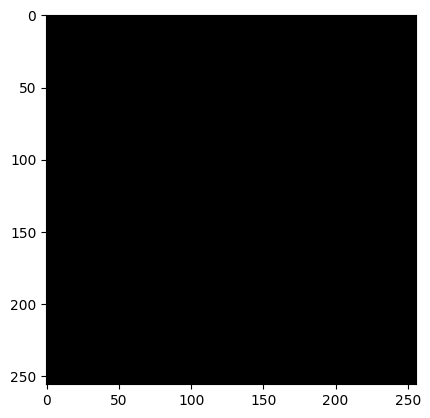

In [30]:
for input_img, target_img in test_dataset.take(1):
    print("Input image tensor:")
    print(input_img)
    plt.imshow(input_img[0])  # Convert to numpy array and plot
    print("Target image tensor:")
    print(target_img[0])

In [31]:
np.shape(list(test_dataset.as_numpy_iterator()))

(2499, 2, 1, 256, 256, 3)

In [32]:
OUTPUT_CHANNELS = 3

In [33]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [34]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result


In [37]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)


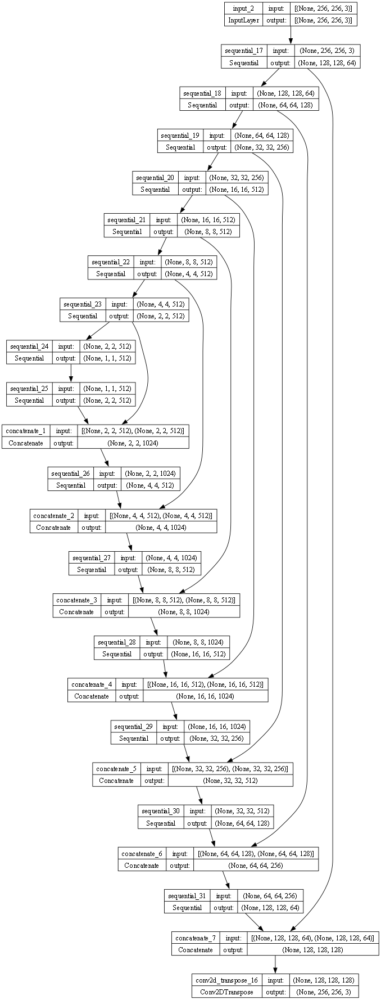

In [38]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [39]:
LAMBDA = 100

In [40]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [41]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [42]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)


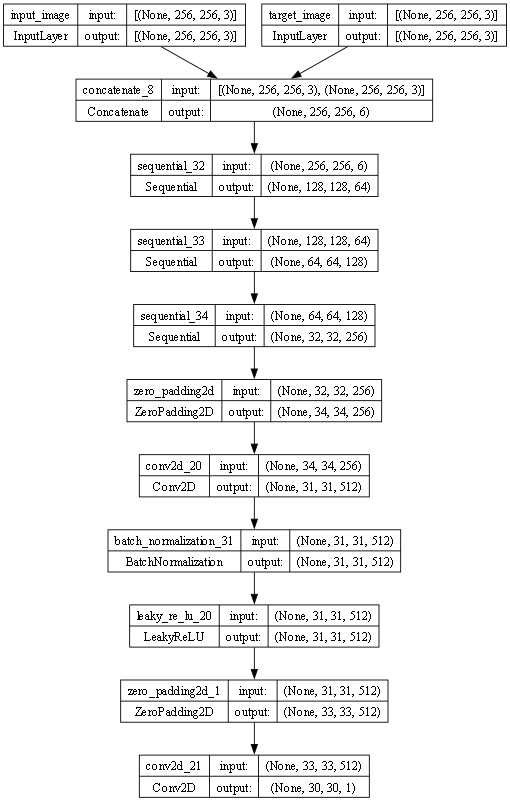

In [43]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
import datetime

log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
def fit(train_ds, test_ds, steps):

  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():

    with tf.device('/CPU:0'):
      if (step) % 1000 == 0:
        display.clear_output(wait=True)

        if step != 0:
          print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

        start = time.time()
        print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    with tf.device('/CPU:0'):
      if (step+1) % 10 == 0:
        print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    with tf.device('/CPU:0'):
      if (step + 1) % 5000 == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)


In [ ]:
fit(train_dataset, test_dataset, steps=6000)

Time taken for 1000 steps: 42.72 sec

Step: 5k
....................................................................................................

In [ ]:
# Check if GPU is available
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
def generate_images(model, test_input, tar):
  
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))


  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

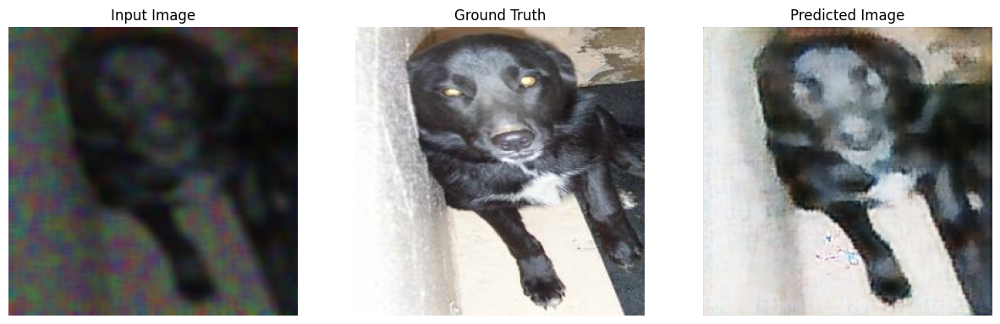

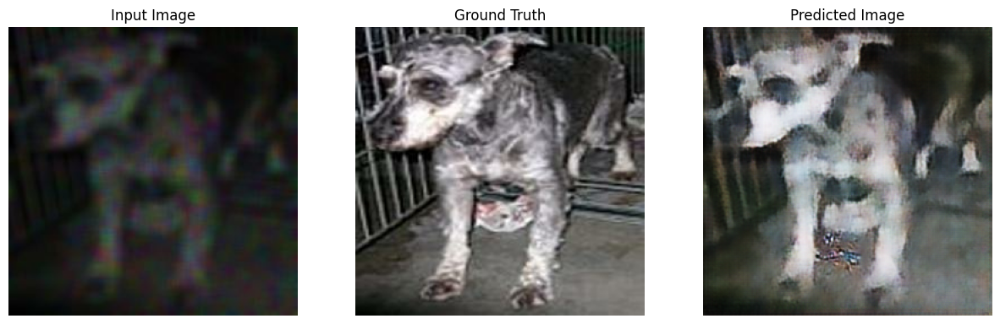

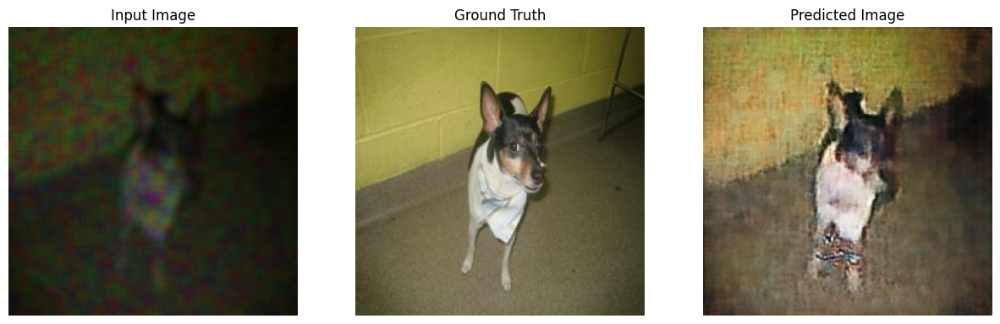

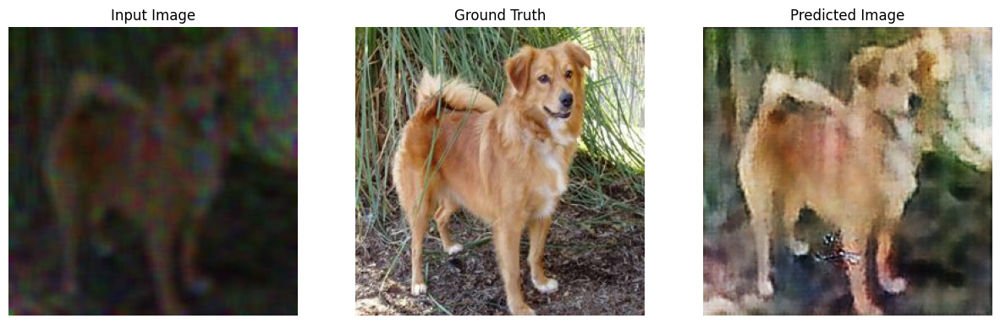

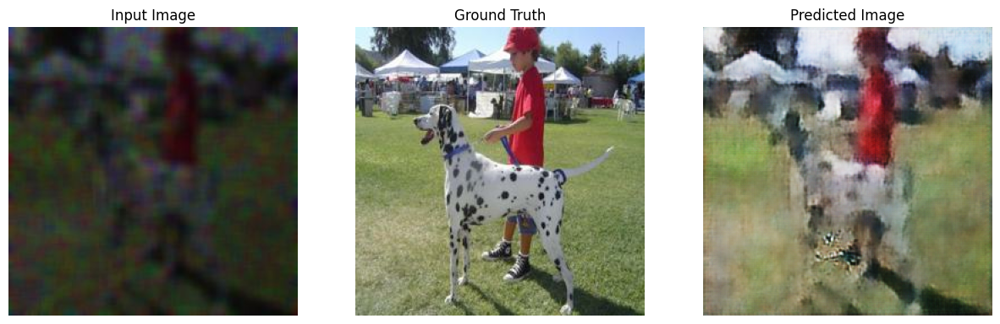

...

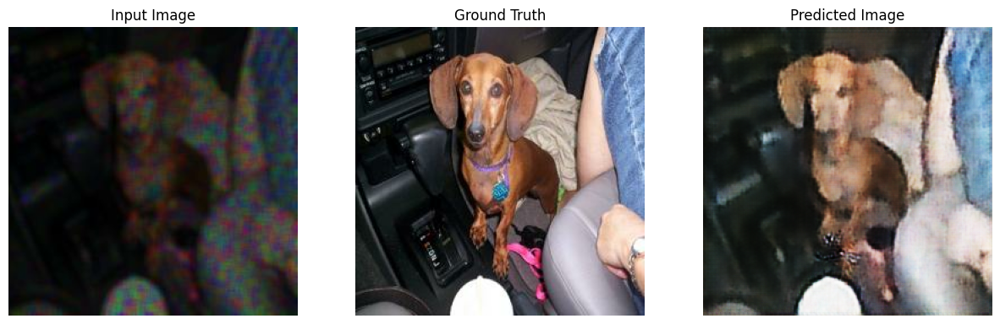

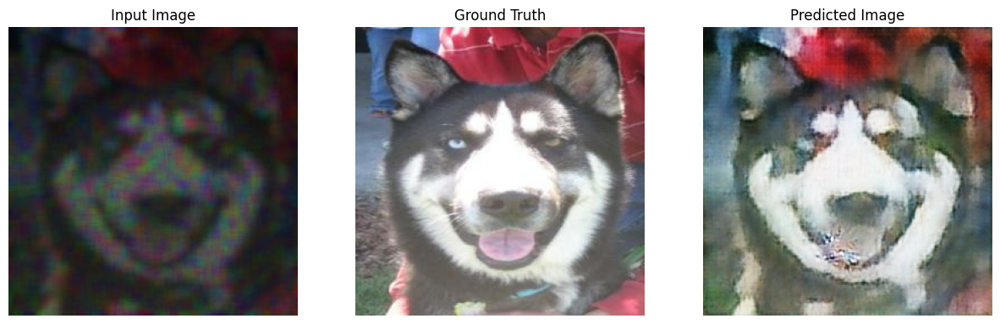

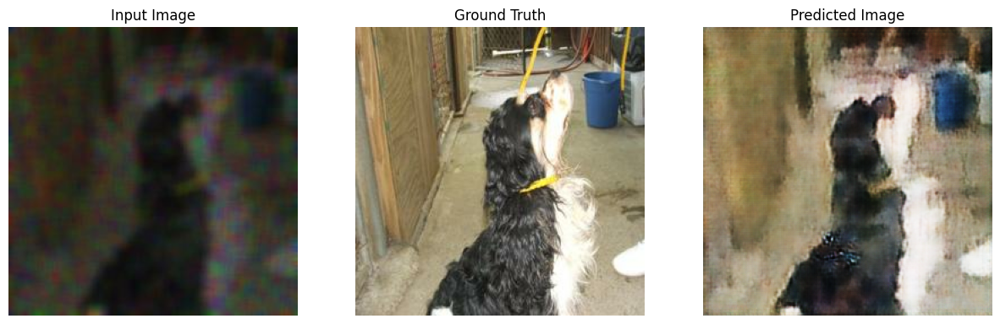

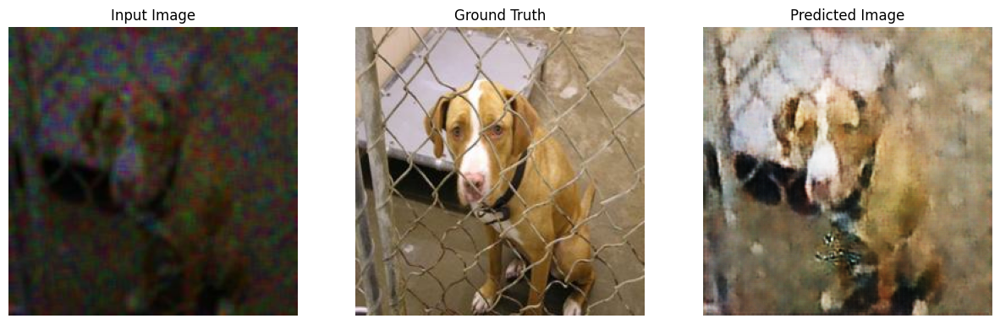

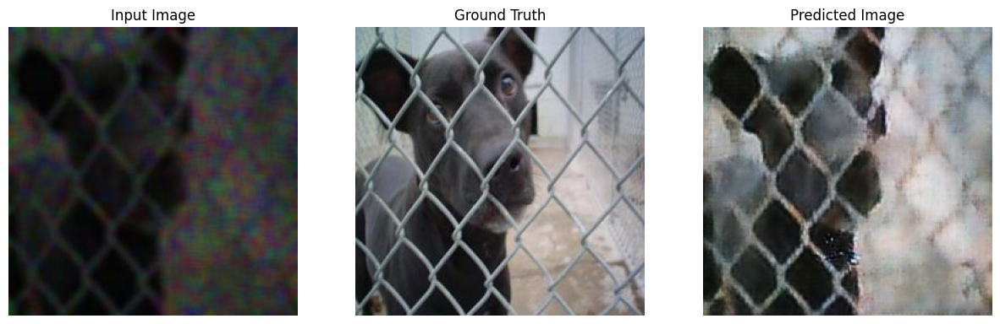

In [ ]:
for inp, tar in list(test_dataset.as_numpy_iterator())[:5]:
    generate_images(generator, inp, tar)